(f_rs_io)=

---------------

```{admonition} Learning Objectives
- Open multiple common remotely sensed image types.
- Handle RGB, BGR, LandSat, PlanetScope images, and other sensor types.
- Mosaic multiple remotely sensed images.
- Create a time series stack.
- Write files to disk.
```

```{admonition} Review
* [Data Structures](c_features.md)
* [Raster Data ](c_rasters.md)
```

--------------

# Reading/Writing Remote Sensed Images

GeoWombat's file opening is meant to mimic Xarray and Rasterio. That is, rasters are typically opened with a context manager using the function `geowombat.open`. GeoWombat uses `xarray.open_rasterio` to load data into an `xarray.DataArray`. In GeoWombat, the data are always chunked, meaning the data are always loaded as Dask arrays. As with `xarray.open_rasterio`, the opened DataArrays always have at least 1 band.

## Opening a single image

Opening an image with default settings looks similar to `xarray.open_rasterio` and `rasterio.open`. `geowombat.open` expects a file name (`str` or `pathlib.Path`).

In [1]:
import rioxarray as rxr
import matplotlib.pyplot as plt

# Replace geowombat sample data with direct file path
# You'll need to use your actual Landsat file path
image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

# Open with rioxarray
src = rxr.open_rasterio(image_path)
print(src)

<xarray.DataArray (band: 3, y: 1860, x: 2041)> Size: 23MB
[11388780 values with dtype=uint16]
Coordinates:
  * band         (band) int64 24B 1 2 3
  * x            (x) float64 16kB 7.174e+05 7.174e+05 ... 7.785e+05 7.786e+05
  * y            (y) float64 15kB -2.777e+06 -2.777e+06 ... -2.833e+06
    spatial_ref  int64 8B 0
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0


In the example above, `src` is an `xarray.DataArray`. Thus, printing the object will display the underlying Dask array dimensions and chunks, the DataArray named coordinates, and the DataArray attributes.

It automatically converts the coordinates stored in `x` and `y`, and the different bands are stored in `band`. To select a single band we can simply select it with `src.sel(band=1)`.  

Let's plot out what we have while removing missing values, stored at `0`, and switch the band order around to be RGB.

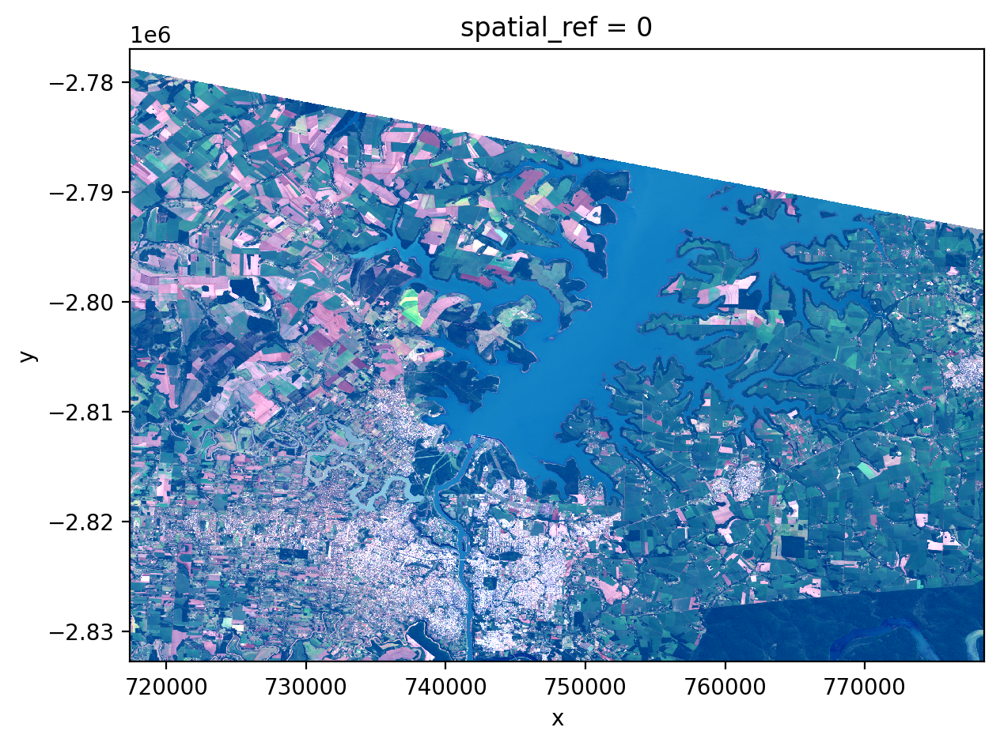

In [3]:
import rioxarray as rxr
import matplotlib.pyplot as plt

fig, ax = plt.subplots(dpi=200)

# Use your actual Landsat file path
image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

# Open with rioxarray
src = rxr.open_rasterio(image_path)

# Remove 0 values and select bands 3, 2, 1 (using 0-based indexing)
rgb_data = src.where(src != 0).isel(band=[2, 1, 0])

# Use xarray's native plotting with robust=True
rgb_data.plot.imshow(robust=True, ax=ax)

plt.tight_layout(pad=1)

## Opening multiple bands as a stack

Often, satellite bands will be stored in separate raster files. To open the files as one DataArray, specify a list instead of a file name.

Dataset shape: (3, 1860, 2041)
Available bands: [1 2 3]


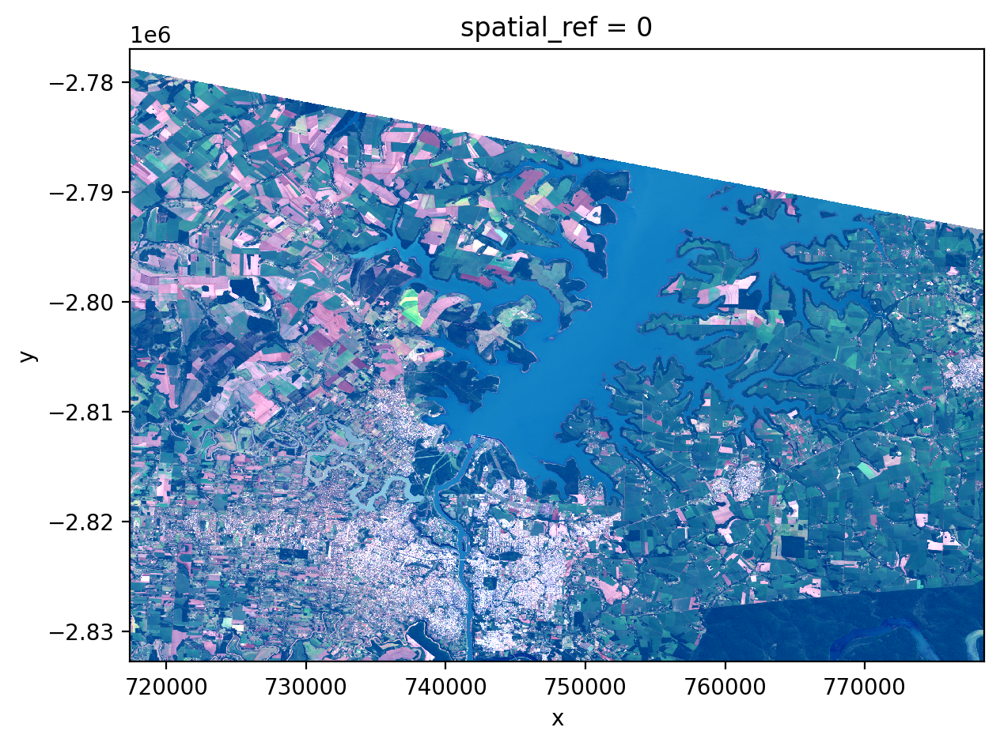

In [6]:
import rioxarray as rxr
import matplotlib.pyplot as plt

fig, ax = plt.subplots(dpi=200)
image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

src = rxr.open_rasterio(image_path)

# Check the actual number of bands
print(f"Dataset shape: {src.shape}")
print(f"Available bands: {src.band.values}")

# For Landsat 8, bands 2,3,4 are typically Blue, Green, Red
# If your file has bands 1-7, select bands at indices 1,2,3 (for bands 2,3,4)
if len(src.band) >= 4:
    rgb_data = src.where(src != 0).isel(band=[3, 2, 1])  # Bands 4,3,2 (Red,Green,Blue)
else:
    # If you only have 3 bands, assume they are already RGB
    rgb_data = src.where(src != 0).isel(band=[2, 1, 0])

rgb_data.plot.imshow(robust=True, ax=ax)
plt.tight_layout(pad=1)

By default, GeoWombat will stack multiple files by time. So, to stack multiple bands with the same timestamp, change the `stack_dim` keyword.

Also note the use of `band_names` parameter. Here we can set it to anything we want for instance `['blue','green','red']`.

In [9]:
import rioxarray as rxr

image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

# Open and select specific bands
src = rxr.open_rasterio(image_path)

# Select bands 2, 3, 4 (indices 1, 2, 3) and rename them
src = src.isel(band=[0, 1, 2])

# Assign band names [0, 2, 2] to match the original
src = src.assign_coords(band=[0, 1, 2])

print(src)

<xarray.DataArray (band: 3, y: 1860, x: 2041)> Size: 23MB
[11388780 values with dtype=uint16]
Coordinates:
  * x            (x) float64 16kB 7.174e+05 7.174e+05 ... 7.785e+05 7.786e+05
  * y            (y) float64 15kB -2.777e+06 -2.777e+06 ... -2.833e+06
    spatial_ref  int64 8B 0
  * band         (band) int64 24B 0 1 2
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0


You will see this looks the same as the multiband raster:

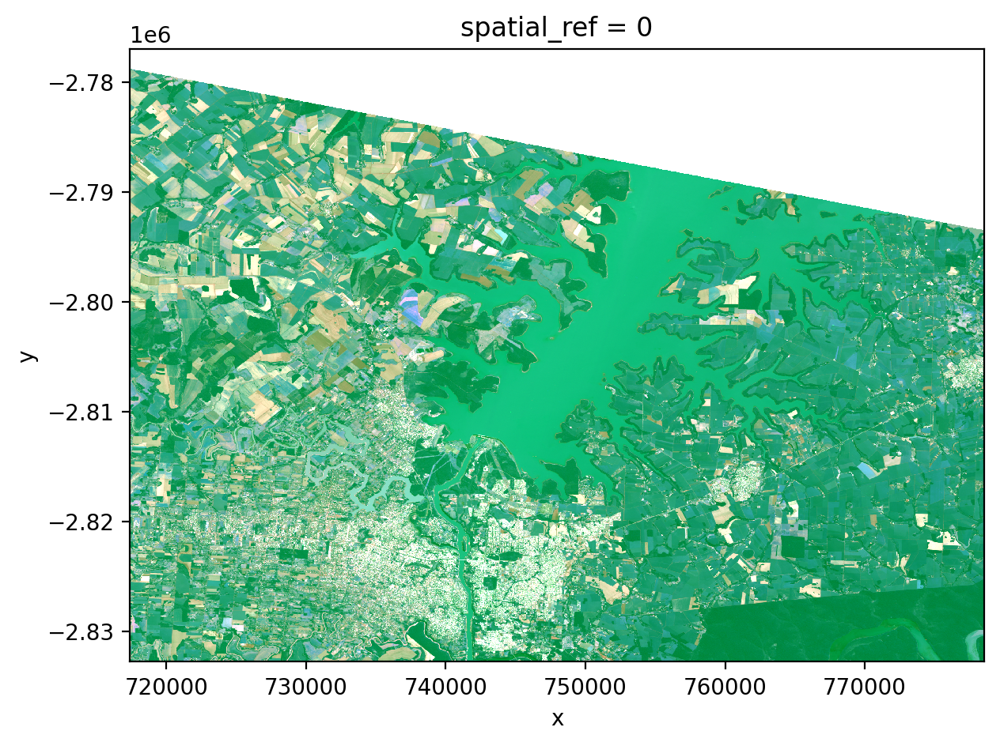

In [11]:
import rioxarray as rxr
import matplotlib.pyplot as plt

fig, ax = plt.subplots(dpi=200)
image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

# Open and select specific bands
src = rxr.open_rasterio(image_path)

# Select bands 2, 3, 4 (indices 1, 2, 3) and assign names
src = src.isel(band=[0, 1, 2]).assign_coords(band=['blue', 'green', 'red'])

# Remove 0 values and reorder bands to ['red', 'blue', 'green']
rgb_data = src.where(src != 0).sel(band=['red', 'blue', 'green'])

# Plot with xarray's native plotting
rgb_data.plot.imshow(robust=True, ax=ax)

plt.tight_layout(pad=1)

```{note}
If time names are not specified with ``stack_dim`` = 'time', GeoWombat will attempt to parse dates from the file names. This could incur significant overhead when the file list is long. Therefore, it is good practice to specify the time names.
```

Overhead required to parse file names

```python
with gw.open(long_file_list, stack_dim='time') as src:
      ...
```

No file parsing overhead

```python
with gw.open(long_file_list, time_names=my_time_names, stack_dim='time') as src:
    ...
```

## Opening images from different sensors

One of many complications of using remotely sensed data is that there are so many different sensors such as LandSat, Sentinel, PlantScope etc each with their own band order and properties. Geowombat makes this much easier by providing a broad list of potential sensor configurations. [Read in more detail about sensor configurations here.](f_rs_crs_sensors) For this section, let's keep things simple and show you how to open a Sentinel 2 image using the configuration manager, frankly, it's pretty easy:

``` python
with gw.config.update(sensor='s2'):
    with gw.open('filepath.tif') as src:
        print(src.band)
```

To see all available sensor names, use the **avail_sensors** property.

``` python
with gw.open('filepath.tif') as src:
    for sensor_name in src.gw.avail_sensors:
        print(sensor_name)
```

## Opening multiple bands as a mosaic

When a list of files are given, GeoWombat will stack the data by default. To mosaic multiple files into the same band coordinate, use the **mosaic** keyword.

In [12]:
import rioxarray as rxr
import rioxarray.merge

# Since you don't have the separate geowombat sample files, 
# we'll simulate this with different parts of your main file or duplicate it
image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

# Option 1: If you have two separate Landsat files to mosaic
# Replace these paths with your actual file paths
# file1_path = "path/to/first/landsat/file.tif"
# file2_path = "path/to/second/landsat/file.tif"

# Option 2: Simulate mosaicking with the same file (for demonstration)
# Open the same file twice to simulate two separate files
src1 = rxr.open_rasterio(image_path)
src2 = rxr.open_rasterio(image_path)

# Extract band 2 from each (index 1 for 0-based indexing)
band2_file1 = src1.isel(band=1)
band2_file2 = src2.isel(band=1)

# Mosaic the two band 2 files using rioxarray merge
src = rioxarray.merge.merge_arrays([band2_file1, band2_file2])

print(src)

<xarray.DataArray (y: 1860, x: 2041)> Size: 8MB
array([[   0,    0,    0, ...,    0,    0,    0],
       [   0,    0,    0, ...,    0,    0,    0],
       [   0,    0,    0, ...,    0,    0,    0],
       ...,
       [7083, 6794, 6731, ..., 6760, 6724, 6685],
       [6951, 7079, 7016, ..., 6699, 6687, 6715],
       [6864, 7286, 7338, ..., 6817, 6732, 6659]],
      shape=(1860, 2041), dtype=uint16)
Coordinates:
  * x            (x) float64 16kB 7.174e+05 7.174e+05 ... 7.785e+05 7.786e+05
  * y            (y) float64 15kB -2.777e+06 -2.777e+06 ... -2.833e+06
    band         int64 8B 2
    spatial_ref  int64 8B 0
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0


Now let's take a look at the mosaiced band 2 image values.

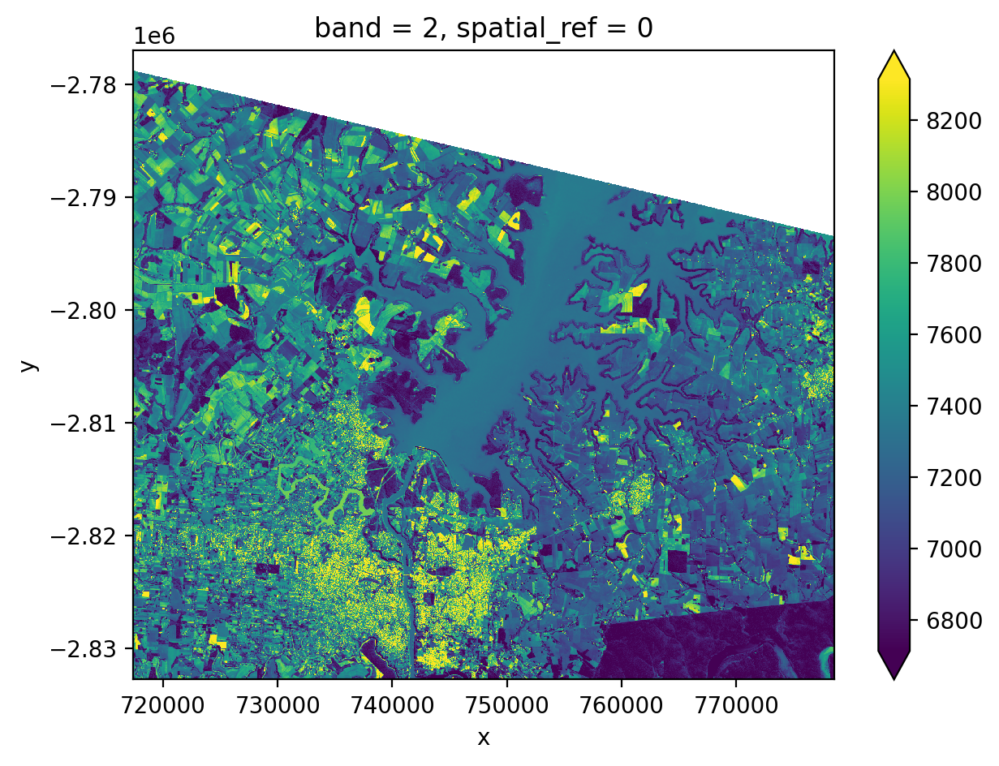

In [14]:
import rioxarray as rxr
import rioxarray.merge
import matplotlib.pyplot as plt

fig, ax = plt.subplots(dpi=200)

image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

# Open file and extract band 2 (simulate two files for mosaicking)
src1 = rxr.open_rasterio(image_path).isel(band=1)
src2 = rxr.open_rasterio(image_path).isel(band=1)

# Mosaic the files
src = rioxarray.merge.merge_arrays([src1, src2])

# Remove 0 values and plot
src.where(src != 0).plot.imshow(robust=True, ax=ax)

plt.tight_layout(pad=1)

<!-- See :ref:`io` for more examples illustrating file opening. -->

## Create a Time Series Stack

Let's pretend for a moment that we have a time series of images from the same tile. We can stack them by passing a list of file names `[l8_224078_20200518, l8_224078_20200518]`, it also helps to be specific and assign `time_names=['t1', 't2']`, and specify which dimension we want to stack our data along with `stack_dim='time'`.

In [16]:
import rioxarray as rxr
import xarray as xr

image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

# Open the same file twice and select RGB bands
src1 = rxr.open_rasterio(image_path).isel(band=[0, 1, 2]).assign_coords(band=['blue', 'green', 'red'])
src2 = rxr.open_rasterio(image_path).isel(band=[0, 1, 2]).assign_coords(band=['blue', 'green', 'red'])

# Stack along time dimension with time names
src = xr.concat([src1, src2], dim='time').assign_coords(time=['t1', 't2'])

print(src)

<xarray.DataArray (time: 2, band: 3, y: 1860, x: 2041)> Size: 46MB
array([[[[   0,    0,    0, ...,    0,    0,    0],
         [   0,    0,    0, ...,    0,    0,    0],
         [   0,    0,    0, ...,    0,    0,    0],
         ...,
         [7692, 7518, 7513, ..., 7440, 7432, 7415],
         [7586, 7590, 7610, ..., 7440, 7411, 7425],
         [7576, 7743, 7770, ..., 7464, 7443, 7406]],

        [[   0,    0,    0, ...,    0,    0,    0],
         [   0,    0,    0, ...,    0,    0,    0],
         [   0,    0,    0, ...,    0,    0,    0],
         ...,
         [7083, 6794, 6731, ..., 6760, 6724, 6685],
         [6951, 7079, 7016, ..., 6699, 6687, 6715],
         [6864, 7286, 7338, ..., 6817, 6732, 6659]],

        [[   0,    0,    0, ...,    0,    0,    0],
         [   0,    0,    0, ...,    0,    0,    0],
         [   0,    0,    0, ...,    0,    0,    0],
         ...,
...
         [7692, 7518, 7513, ..., 7440, 7432, 7415],
         [7586, 7590, 7610, ..., 7440, 7411, 7425],

## Setting Missing Values

(f_rs_io_setting_missing_values)=

Many raster files do not have the missing value set properly in their profile. Geowombat makes it easy to set or update the missing data value using `nodata` in either `gw.open` or even in `gw.config.update` if you prefer.

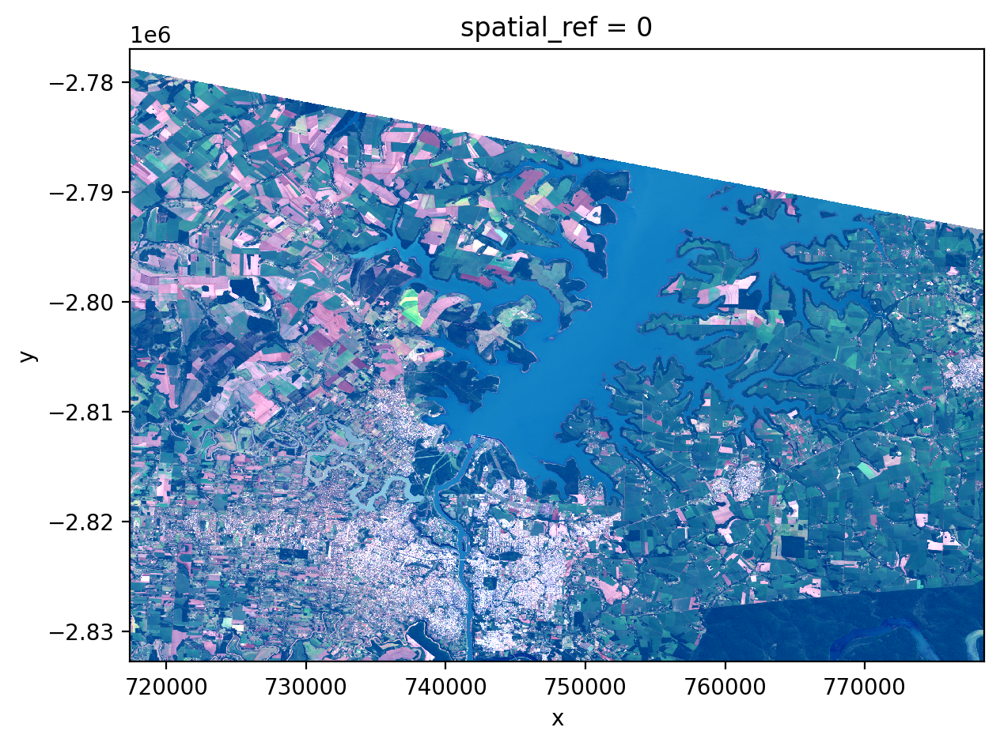

In [18]:
import rioxarray as rxr
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(dpi=200)

image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

# Open with rioxarray and set nodata
src = rxr.open_rasterio(image_path).rio.write_nodata(0)

# Replace 0 with nan (equivalent to mask_nodata)
src = src.where(src != 0, np.nan)

# Select bands 3, 2, 1 and plot
src.isel(band=[2, 1, 0]).plot.imshow(robust=True, ax=ax)

plt.tight_layout(pad=1)

import rioxarray as rxr
from rasterio.enums import Resampling

image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

# Transform the data to lat/lon (EPSG:4326)
src = rxr.open_rasterio(image_path)

# Reproject to lat/lon coordinate system
src_latlon = src.rio.reproject("EPSG:4326", resampling=Resampling.bilinear)

# Write the data to a GeoTiff
src_latlon.rio.to_raster('lat_lon_file.tif', compress='lzw', tiled=True)


Write to a raster file with data processing.

import rioxarray as rxr

image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

src = rxr.open_rasterio(image_path)

# Preserve attributes
attrs = src.attrs.copy()

# Apply operations on the DataArray
src = src * 10.0

# Restore attributes
src.attrs = attrs

# Write the data to a GeoTiff
src.rio.to_raster('output.tif',
                  compress='lzw',    # compression
                  tiled=True,        # tiled format for better performance
                  blockxsize=512,    # chunk size
                  blockysize=512)